In [10]:
import pandas as pd
df = pd.read_csv('smoking.csv')
df = df[:10000]

In [11]:
df = df.drop(['ID','height(cm)','oral'], axis=1)
df['tartar'] = df['tartar'].apply(lambda x: 1 if x == 'Y' else 0)
df['gender'] = df['gender'].apply(lambda x: 1 if x == 'M' else 0)

In [12]:
variabili_pca = list(df.columns[:-1])
print(variabili_pca)

['gender', 'age', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 'hearing(left)', 'hearing(right)', 'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST', 'ALT', 'Gtp', 'dental caries', 'tartar']


In [13]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[variabili_pca])
scaled_data # nuovo dataset con standardizzate le colonne

array([[-1.32085772, -0.34651724, -0.45747648, ..., -0.25754979,
        -0.52075676,  0.89442719],
       [-1.32085772, -0.34651724, -0.45747648, ..., -0.4365115 ,
        -0.52075676,  0.89442719],
       [ 0.75708381,  0.8960986 , -0.45747648, ..., -0.35697296,
        -0.52075676, -1.11803399],
       ...,
       [-1.32085772,  0.8960986 , -1.23749609, ..., -0.55581931,
        -0.52075676, -1.11803399],
       [ 0.75708381,  1.31030388, -0.45747648, ..., -0.4365115 ,
        -0.52075676, -1.11803399],
       [ 0.75708381,  0.8960986 , -0.06746668, ...,  0.02083509,
        -0.52075676,  0.89442719]])

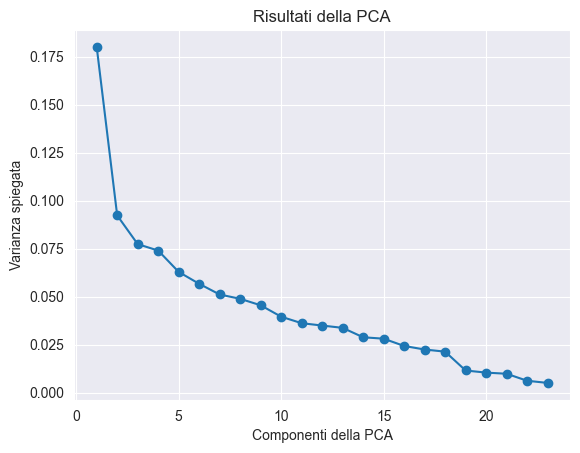

In [14]:
import matplotlib.pyplot as plt

pca = PCA().fit(scaled_data)

# Crea un grafico della varianza spiegata per ogni componente
plt.plot(range(1, pca.n_components_ + 1), pca.explained_variance_ratio_, marker='o')
plt.xlabel('Componenti della PCA')
plt.ylabel('Varianza spiegata')
plt.title("Risultati della PCA")
plt.show()

In [15]:
# Applica la PCA per ridurre la dimensionalità dei dati
pca = PCA(n_components=15).fit(scaled_data)
pca_data = pca.transform(scaled_data)
# Quantifichiamo la percentuale di varianza spiegata da ciascuno delle componenti.
print(pca.explained_variance_ratio_)

[0.1800006  0.09223037 0.07729626 0.07394373 0.0628214  0.05662366
 0.05106051 0.04881005 0.04544729 0.03949577 0.03611691 0.03489084
 0.03368541 0.02878291 0.02805161]


In [16]:
sum = 0
for data in pca.explained_variance_ratio_:
    sum += data
print(sum)

0.8892573207978833


In [17]:
pca_df = pd.DataFrame(abs(pca.components_[:15]), columns=df.columns[:-1],
                     index=['PC1','PC2','PC3','PC4','PC5',
                            'PC6','PC7','PC8','PC9','PC10','PCA11','PCA12','PCA13','PCA14','PCA15'])
pca_df

,gender,age,weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,tartar
PC1,0.358494,0.104615,0.398007,0.372268,0.062590,0.064514,0.008476,0.012194,0.223238,0.233217,...,0.232425,0.037398,0.344566,0.043236,0.228578,0.165353,0.220889,0.224188,0.054278,0.046519
PC2,0.239656,0.449859,0.134241,0.045994,0.253062,0.246665,0.256671,0.254188,0.284325,0.244469,...,0.036420,0.178840,0.164041,0.069379,0.161200,0.204481,0.154576,0.177795,0.079797,0.068100
PC3,0.087562,0.127611,0.004842,0.024388,0.087865,0.085763,0.272544,0.272055,0.054213,0.000353,...,0.133324,0.603178,0.024471,0.054995,0.038497,0.021961,0.006767,0.007447,0.027336,0.052799
PC4,0.063246,0.097640,0.089859,0.114685,0.032020,0.033594,0.119310,0.125830,0.253781,0.236161,...,0.118618,0.109319,0.050152,0.025053,0.081874,0.601053,0.557949,0.302203,0.003769,0.001561
PC5,0.143859,0.033331,0.025097,0.028525,0.028853,0.020074,0.462205,0.467539,0.415338,0.433830,...,0.141967,0.247408,0.110294,0.008965,0.215292,0.001331,0.025029,0.037968,0.043168,0.038086
PC6,0.001618,0.081946,0.063478,0.117303,0.490129,0.493703,0.276685,0.268818,0.273314,0.282698,...,0.310579,0.004851,0.016255,0.011899,0.026811,0.082848,0.052803,0.022297,0.029120,0.087943
PC7,0.070164,0.142755,0.028708,0.081249,0.225307,0.218450,0.137151,0.143854,0.085938,0.093299,...,0.204514,0.012672,0.083404,0.076520,0.048155,0.031407,0.018139,0.021740,0.615440,0.558505
PC8,0.217854,0.070409,0.002288,0.081266,0.303653,0.330794,0.029389,0.030043,0.101979,0.111081,...,0.308732,0.056304,0.226661,0.093248,0.355863,0.067446,0.022772,0.054202,0.290973,0.374557
PC9,0.056695,0.076551,0.150297,0.158932,0.112598,0.065839,0.065934,0.049876,0.069723,0.061500,...,0.170834,0.018469,0.041370,0.787437,0.259423,0.072074,0.125780,0.151579,0.110743,0.107676
PC10,0.206428,0.119512,0.260094,0.283230,0.032704,0.013870,0.040719,0.040095,0.050059,0.032490,...,0.240744,0.119557,0.226511,0.540832,0.180685,0.085914,0.160327,0.372469,0.081241,0.039540


In [18]:
# crea un nuovo dataframe con le componenti principali
df_pca = pd.DataFrame(data = pca_data,
                      columns = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PCA11','PCA12','PCA13','PCA14','PCA15'])

# aggiungi la colonna target al nuovo dataframe
df_pca['target'] = df['smoking']

# Finita PCA, inizio Decision Tree

In [19]:
from sklearn.model_selection import train_test_split

X = df_pca.drop('target', axis=1)
y = df_pca['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [20]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)

# Visualizza l'albero decisionale
fig, ax = plt.subplots(figsize=(150, 100))
plot_tree(model, filled=True, ax=ax)
plt.plot()

[]

In [21]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred = model.predict(X_test)

cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:\n", cm)
accuracy_pruned = model.score(X_test, y_test)
print("\n Accuracy: ", accuracy_pruned)

print("Test Set Performance:")
print(classification_report(y_test, y_pred))

Confusion matrix:
 [[8554 2003]
 [1960 4191]]

Accuracy: 0.762808235575772


In [22]:
path = model.cost_complexity_pruning_path(X_train, y_train)

ccp_alphas = path.ccp_alphas

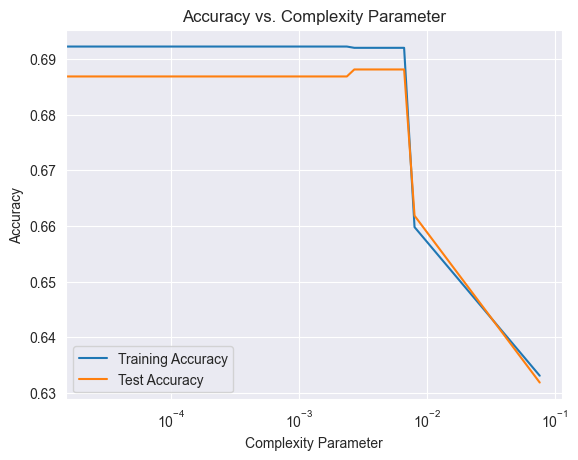

In [23]:
# valori di complessità candidati ad essere tagliati dal modello
# complexity_values = [0.001, 0.01, 0.1, 1, 10, 100]
ccp_alphas = path.ccp_alphas

# Addestra l'albero decisionale con diversi valori di complessità
train_accuracy = []
test_accuracy = []
for complexity in ccp_alphas:
    clf = DecisionTreeClassifier(max_depth=3, ccp_alpha=complexity)
    clf.fit(X_train, y_train)
    train_accuracy.append(clf.score(X_train, y_train))
    test_accuracy.append(clf.score(X_test, y_test))

# Plotta l'accuratezza del modello in funzione del parametro di complessità
plt.plot(ccp_alphas, train_accuracy, label='Training Accuracy')
plt.plot(ccp_alphas, test_accuracy, label='Test Accuracy')
plt.xlabel('Complexity Parameter')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Complexity Parameter')
plt.xscale('log')
plt.legend()
plt.show()

In [24]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 3 with ccp_alpha: 0.07607497663170498


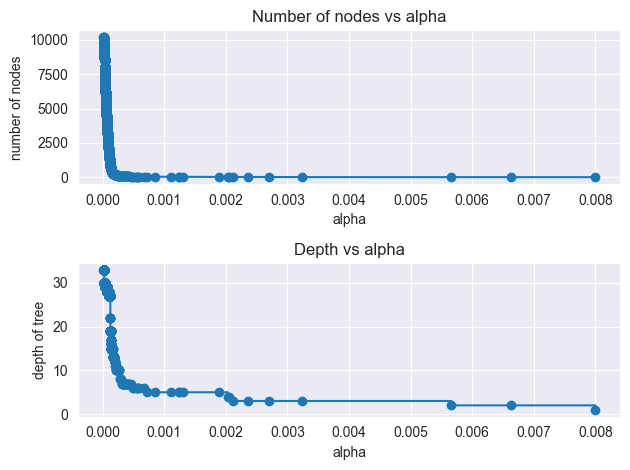

In [25]:
clfs = clfs[:-1]
complexity_values = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(complexity_values, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(complexity_values, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

In [26]:
# Potiamo albero con alpha=0.001
clf_pruned = DecisionTreeClassifier(max_depth=3, ccp_alpha=0.001)
clf_pruned.fit(X_train, y_train)

0.6868565956428059


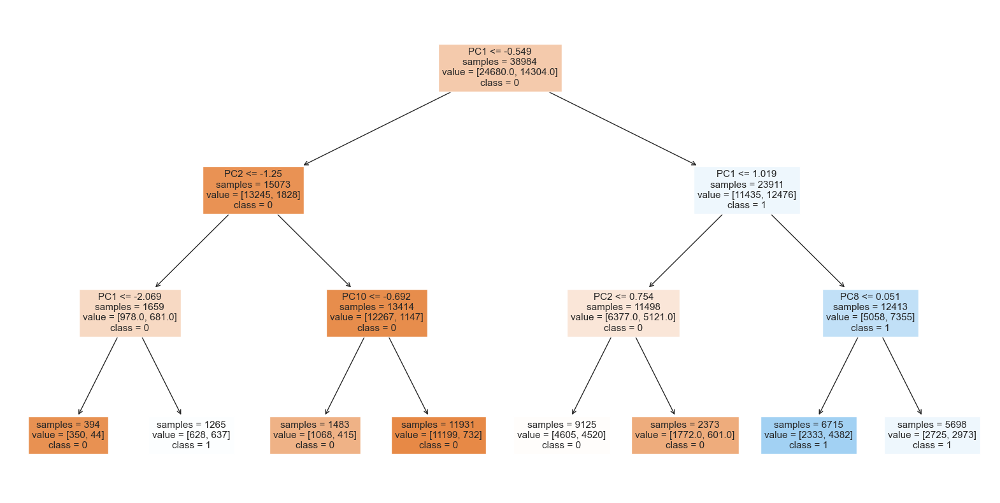

Confusion matrix:
 [[8073 2484]
 [2748 3403]]

Accuracy: 0.6868565956428059


In [27]:
from sklearn.tree import plot_tree

fig, ax = plt.subplots(figsize=(20, 10))
plot_tree(clf_pruned,
          feature_names=X_train.columns,
          class_names=[str(x) for x in clf_pruned.classes_],
          filled=True,
          ax=ax,
          impurity=False)

plt.show()
from sklearn.metrics import confusion_matrix

y_pred = clf_pruned.predict(X_test)

cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:\n", cm)
accuracy_pruned = clf_pruned.score(X_test, y_test)
print("\n Accuracy: ", accuracy_pruned)

print("Test Set Performance:")
print(classification_report(y_test, y_pred))